<a href="https://colab.research.google.com/github/causallycausal/fastai/blob/dev/Projects/Pizza_Classifier/02_pizza_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -Uqq fastbook
import fastbook 
fastbook.setup_book()

     |████████████████████████████████| 727kB 14.7MB/s 
     |████████████████████████████████| 194kB 56.3MB/s 
     |████████████████████████████████| 1.2MB 58.4MB/s 
     |████████████████████████████████| 51kB 8.9MB/s 
     |████████████████████████████████| 61kB 9.6MB/s 
Mounted at /content/gdrive


In [ ]:
from fastbook import *
from fastai.vision.widgets import *

# Goal 

Our goal with this project is to design an application that will classify three different types of pizza. The three categories will be cheese, pepperoni, and Hawaiian (ham and pineapple) pizza. In this notebook, we will gather the data, build the model, and  export the weights of the trained model to be used in a fun webapp. I will link to the webapp here after I have completed this project. 

# Import Images from Drive 


In [ ]:
path = Path('./gdrive/MyDrive/pizzas')
path.ls()

(#3) [Path('gdrive/MyDrive/pizzas/cheese'),Path('gdrive/MyDrive/pizzas/pepperoni'),Path('gdrive/MyDrive/pizzas/Hawaiian')]

# Download Images from the Internet 


In [ ]:
# Search key using duck duck go search engine.
# current fastai version is broken 
def search_images_ddg(key,max_n=200):
     """Search for 'key' with DuckDuckGo and return a unique urls of 'max_n' images
        (Adopted from https://github.com/deepanprabhu/duckduckgo-images-api)
     """
     url        = 'https://duckduckgo.com/'
     params     = {'q':key}
     res        = requests.post(url,data=params)
     searchObj  = re.search(r'vqd=([\d-]+)\&',res.text)
     if not searchObj: print('Token Parsing Failed !'); return
     requestUrl = url + 'i.js'
     headers    = {'User-Agent': 'Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:71.0) Gecko/20100101 Firefox/71.0'}
     params     = (('l','us-en'),('o','json'),('q',key),('vqd',searchObj.group(1)),('f',',,,'),('p','1'),('v7exp','a'))
     urls       = []
     while True:
         try:
             res  = requests.get(requestUrl,headers=headers,params=params)
             data = json.loads(res.text)
             for obj in data['results']:
                 urls.append(obj['image'])
                 max_n = max_n - 1
                 if max_n < 1: return L(set(urls))     # dedupe
             if 'next' not in data: return L(set(urls))
             requestUrl = url + data['next']
         except:
             pass

In [ ]:
pizza_types = ["cheese", "pepperoni", "Hawaiian"]
path = Path('pizzas')

In [ ]:
if not path.exists():
  path.mkdir()
  for pizza in pizza_types: 
    dest = (path/pizza)
    dest.mkdir(exist_ok = True)
    results = search_images_ddg(f'{pizza} pizza')
    download_images(dest, urls=results)

# Gather Images of Pizza



In [ ]:
image_paths = get_image_files(path)
image_paths

(#330) [Path('gdrive/MyDrive/pizzas/cheese/00000006.jpg'),Path('gdrive/MyDrive/pizzas/cheese/00000001.jpg'),Path('gdrive/MyDrive/pizzas/cheese/00000011.jpg'),Path('gdrive/MyDrive/pizzas/cheese/00000012.jpg'),Path('gdrive/MyDrive/pizzas/cheese/00000033.jpg'),Path('gdrive/MyDrive/pizzas/cheese/00000002.jpg'),Path('gdrive/MyDrive/pizzas/cheese/00000013.jpg'),Path('gdrive/MyDrive/pizzas/cheese/00000022.jpg'),Path('gdrive/MyDrive/pizzas/cheese/00000008.jpg'),Path('gdrive/MyDrive/pizzas/cheese/00000007.jpg')...]

# Verify our Images 

In [ ]:
# Check if we can open our images 
failed = verify_images(image_paths)
failed

(#0) []

In [ ]:
# Remove all images that we can't open 
failed.map(Path.unlink);

In [ ]:
len(image_paths)

488

In [ ]:
for badpath in failed: 
  image_paths.remove(badpath)

In [ ]:
len(image_paths)

488

# Clean Up Image Data

In [ ]:
"""
Try to reproduce: usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
"""
extensions = []
for img in image_paths: 
  if img.suffix not in extensions: 
    extensions.append(img.suffix)
len(extensions), extensions

(4, ['.jpg', '.png', '.jpeg', '.JPG'])

In [ ]:
# Count the number of each extension. 
from collections import Counter 
counts = Counter([image.suffix for image in image_paths])
counts

Counter({'.JPG': 6, '.jpeg': 4, '.jpg': 336, '.png': 24})

In [ ]:
for img in image_paths: 
  if img.suffix == ".gif":
    print(img)

In [ ]:
# Remove .gif 
gif_remove = L()
for img in image_paths: 
  if img.suffix == ".gif":
    gif_remove.append(img)
gif_remove

(#0) []

In [ ]:
gif_remove.map(Path.unlink);

In [ ]:
for badpath in gif_remove:
  image_paths.remove(badpath)

In [ ]:
len(image_paths)

501

# Set up DataLoader 

In [ ]:
pizzas = DataBlock(
    blocks=(ImageBlock, CategoryBlock), # Type of (input, labels)
    get_items=get_image_files, # function used to get image data
    splitter=RandomSplitter(valid_pct=0.2, seed=42), # function to split images into valid/test sets
    get_y=parent_label, # tells us that our labels will come from the parent directory 
    item_tfms=Resize(128)) # resize images to 128x128


In [ ]:
dls = pizzas.dataloaders(path)

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


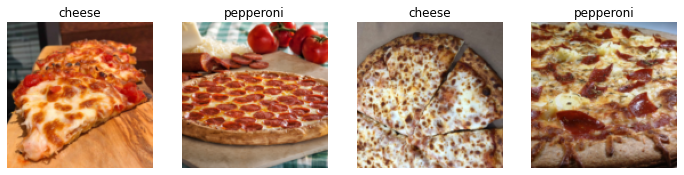

In [ ]:
dls.valid.show_batch(max_n=4, nrows=1)

# Item Transformations 


## Format 
1. Make new DataBlock with the Transformation 
2. Load the DataBlock 


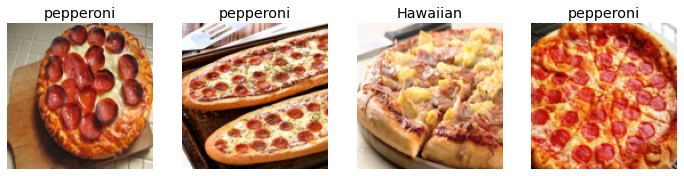

In [ ]:
# Squish Method 
pizzas = pizzas.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = pizzas.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

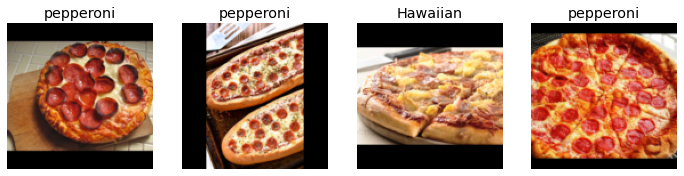

In [ ]:
# Pad method 
pizzas = pizzas.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = pizzas.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

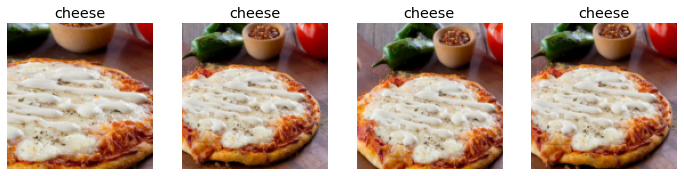

In [ ]:
# Random Resized Crop
pizzas = pizzas.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = pizzas.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

# Data Augmentation


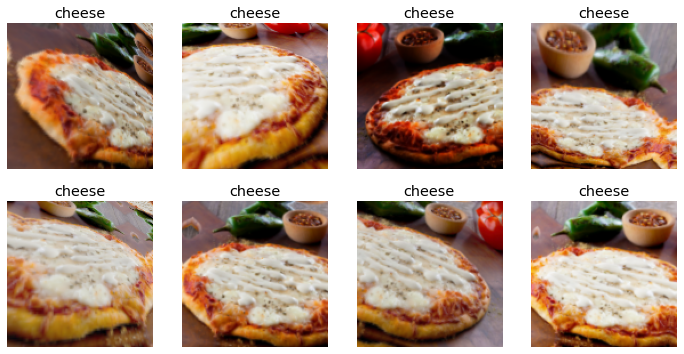

In [ ]:
pizzas = pizzas.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = pizzas.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

# Train Our Model and Use It for Data Cleaning 

In [ ]:
pizzas = pizzas.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = pizzas.dataloaders(path)

In [ ]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,1.734480,0.916280,0.409091,00:15


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,0.833062,0.483586,0.212121,00:16
1,0.731713,0.238116,0.060606,00:16
2,0.572928,0.153476,0.045455,00:16
3,0.472914,0.121518,0.030303,00:15
4,0.410658,0.117723,0.045455,00:16


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency e

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


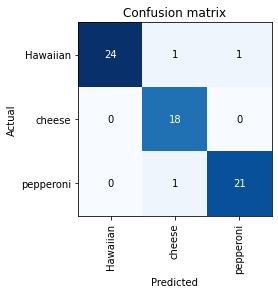

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

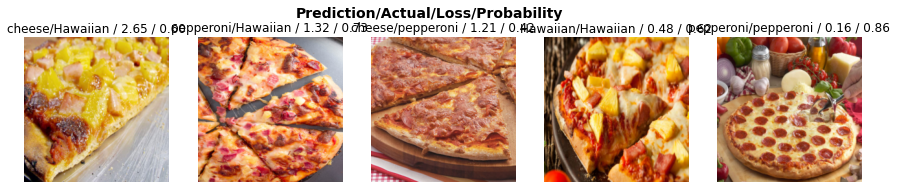

In [ ]:
interp.plot_top_losses(5, nrows=1)

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

FileNotFoundError: ignored

In [ ]:
for idx,cat in cleaner.change(): 
  try: 
    shutil.move(str(cleaner.fns[idx]), path/cat)
  except Exception as e:
    print(e)
    print("Deleting Image")
    cleaner.fns[idx].unlink() 
    

# Save Weights for Inference 




In [45]:
learn.export()

In [49]:
path = Path()
path

Path('.')

In [50]:
path.ls(file_exts=".pkl")

(#1) [Path('export.pkl')]

In [51]:
!git add 

drive  gdrive  sample_data
